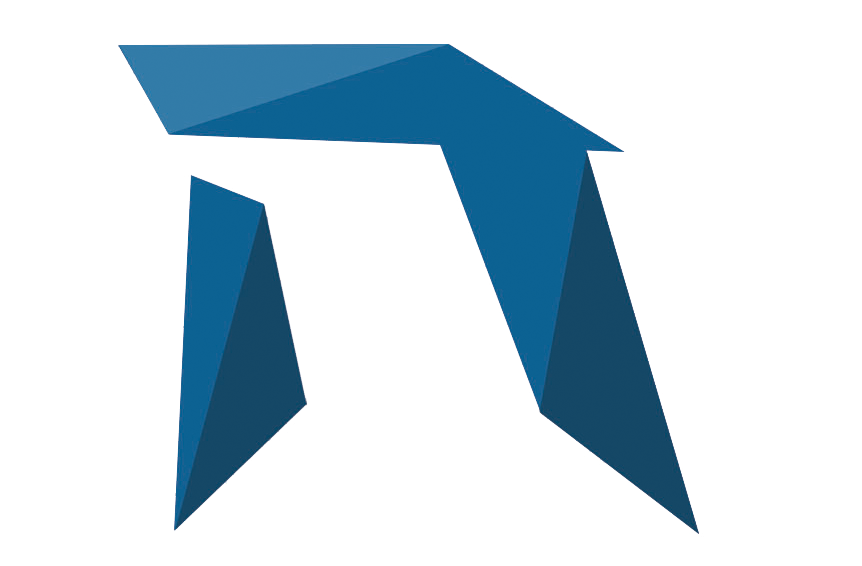

***
# HEICODERS ACADEMY
<b>AI100: Python Programming & Data Visualisation</b><br>
***
<b>Session 7:</b> In-Class Analytics Project with Geospatial Visualisation [Student Notebook]
***

<b>Learning Outcomes:</b>

- Understand the Data Science project lifecycle
- Data preparation and exploratory analysis, consolidating concepts learnt from Lessons 1 to 6
- Translate business requirements into an analytics solution (AirBnB case study)
- Geospatial visualisation with Folium & scatterplots
- Visualisation of text data with word clouds

<b>Dataset Used:</b>

- Singapore Airbnb listings & ratings dataset, taken from [Kaggle](https://www.kaggle.com/sarvasaga/airbnb-singapore-listing)

<b>Content</b>

- [1.The Big Picture](#1.The-Big-Picture)
    - [1a. Data Science Project Lifecycle](#1a.-Data-Science-Project-Lifecycle)
    - [1b. Approach for this Session](#1b.-Approach-for-this-Session)
- [2.Airbnb Data Analytics](#2.Airbnb-Data-Analytics)
    - [2a. Background of Airbnb](#2a.-Background-of-Airbnb)
    - [2b. Load Data](#2b.-Load-Data)
    - [2c. Data Cleaning](#2c.-Data-Cleaning)
    - [2d. Data Exploration: Neigbourhood Listings [Student Exercise]](#2d.-Data-Exploration:-Neigbourhood-Listings-[Student-Exercise])
    - [2e. Data Exploration: Top 10 Neigbourhood with Most Listings](#2e.-Data-Exploration:-Top-10-Neigbourhood-with-Most-Listings)
    - [2f. Data Exploration: Top 10 Host with most Listings [Student Exercise]](#2f.-Data-Exploration:-Top-10-Host-with-most-Listings-[Student-Exercise])
    - [2g. Data Exploration: Visualise Top 10 Host Listings [Student Exercise]](#2g.-Data-Exploration:-Visualise-Top-10-Host-Listings-[Student-Exercise])
    - [2h. Data Exploration - Room Type Listings [Student Exercise]](#2h.-Data-Exploration:-Room-Type-Listings-[Student-Exercise])
    - [2i. Data Exploration: Room Type Listings Visualise with Pie Chart](#2i.-Data-Exploration:-Room-Type-Listings-Visualise-with-Pie-Chart)
    - [2j. Data Exploration: Property Type Listings Visualise with Pie Chart [Student Exercise]](#2j.-Data-Exploration:-Property-Type-Listings-Visualise-with-Pie-Chart-[Student-Exercise])
    - [2k. Data Exploration: Understanding Listings Density with Folium Heatmap](#2k.-Data-Exploration:-Understanding-Listings-Density-with-Folium-Heatmap)
    - [2l. Data Exploration: Understanding Listings Density with Folium Heatmap [Student Exercise]](#2l.-Data-Exploration:-Understanding-Listings-Density-with-Folium-Heatmap-[Student-Exercise])
    - [2m. Data Exploration: Showing Exact Position of Listing with Folium Marker](#2m.-Data-Exploration:-Showing-Exact-Position-of-Listing-with-Folium-Marker)
    - [2n. Data Exploration: Showing Density Exact Position of Listing with Folium Marker Cluster](#2n.-Data-Exploration:-Showing-Density-Exact-Position-of-Listing-with-Folium-Marker-Cluster)
    - [2o. Data Exploration: Showing Density Exact Position of Listing with Folium Marker Cluster [Student Exercise]](#2o.-Data-Exploration:-Showing-Density-Exact-Position-of-Listing-with-Folium-Marker-Cluster-[Student-Exercise])
    - [2p. Data Exploration: Plotting Satisfaction on Map via Matplotlib (Optional)](#2p.-Data-Exploration:-Plotting-Satisfaction-on-Map-via-Matplotlib-(Optional))
    - [2q. Data Exploration: Word Cloud of Description](#2q.-Data-Exploration:-Word-Cloud-of-Description)
    - [2r. Data Exploration: Word Cloud of Description [Student Exercise]](#2r.-Data-Exploration:-Word-Cloud-of-Description-[Student-Exercise])

1.The Big Picture
===
***

1a. Data Science Project Lifecycle
---

In this lesson, once again we will guide you through the first 2 phases of the data science project lifecycle, namely: <b>Data Preparation (consolidating concepts from session 1 to 6) </b> & <b>Exploratory Analysis (taught in session 6)</b>.

<img src='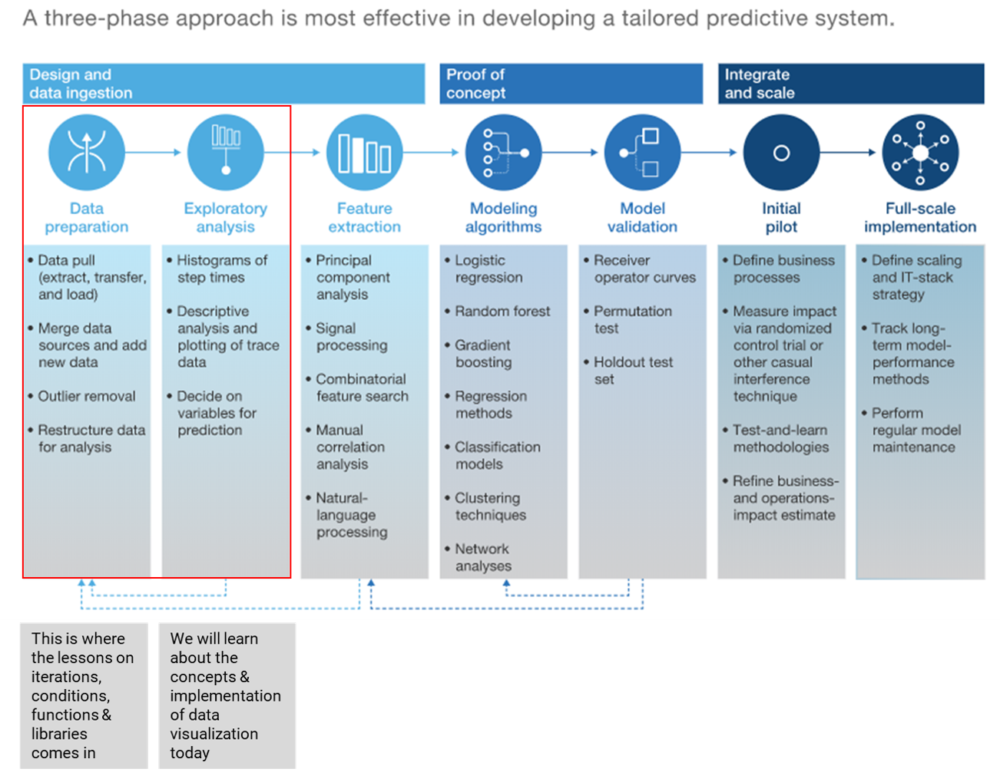
' width='600' height='400'/>

Source: McKinsey & Company

1b. Approach for this Session
---

We will spend the first half of the lesson walking through <b>the first 2 phases of Data Science Project Lifecycle with an Airbnb data analytics case study</b>, to help students build an intuition for applying everything you have learnt thus far into a real-life data analytics project. Along the way, you will also learn to implement new visualisations like (1) geospatial mapping and (2) word clouds.

Expect lots of hands-on in this session!

2.Airbnb Data Analytics
===
---

2a. Background of Airbnb
---

Airbnb is a rental online marketplace company based in San Francisco, California, United States. Airbnb offers arrangement for lodging, primarily homestays, or tourism experiences. The dataset we are using contains all the Airbnb listings & reviews in Singapore, which were scraped from the actual Airbnb website.

<img src='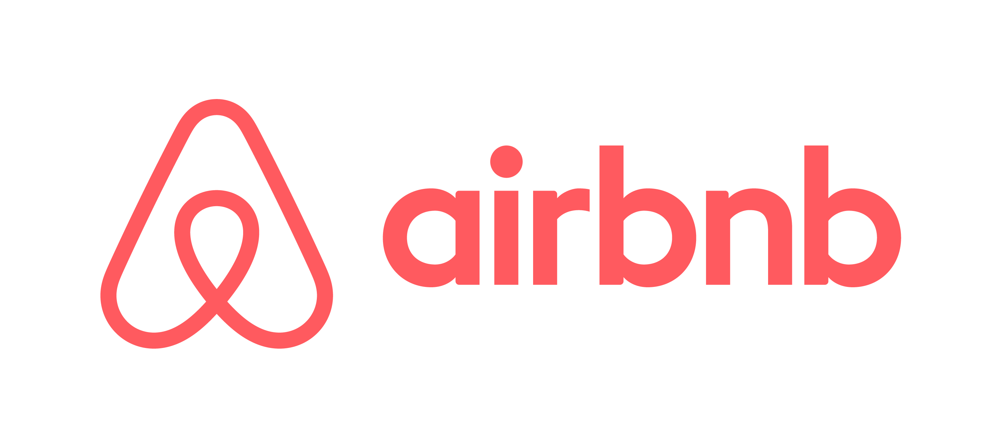
' width='300' height='150'/>

2b. Load Data
---

We start by first loading the CSV data of Singapore Airbnb listings (8293 rows × 24 columns) into a nested python data structure - <b>singapore_airbnb_listings</b>.

In [1]:
# Run this cell to load the Airbnb dataset into a nested list
import csv

singapore_airbnb_listings = []

# Read the first csv file into nested list
with open('data/singapore_airbnb_listings.csv', newline='', encoding='utf8') as f:
    reader = csv.reader(f)
    for row in reader:
        singapore_airbnb_listings.append(row)

    # Remove header
    singapore_airbnb_dataheaders = singapore_airbnb_listings[0]
    singapore_airbnb_listings = singapore_airbnb_listings[1:]
    
print(singapore_airbnb_listings[0]) # Print first row of data

['49091', 'https://www.airbnb.com/rooms/49091', 'COZICOMFORT LONG TERM STAY ROOM 2', "This is Room No. 2.(available after Jan 15 2014) USD750 per month.  You may want to take a look at room number 1 as well. Room NO 1 is available immediately at USD700 per month Its at the far right corner of your screen below. Please note that currency is in USD unless stated as SGD. only LONG TERM STAY (6 months minimum) Place is available only to adults. Good location. 10 minutes walk to train station. 10 minutes walk to Bus stops.  7 minutes walk to 24 hour food center.  7 minutes walk to two 24 hour supermarkets.  10 minutes walk to 24/7 McDonald's. 30 minutes train ride to Orchard road. On Friday's/Saturday's, you can take the Night Rider bus from Orchard or from Clarke Quay direct back home and save taxi fare!   Room is clean,cozy and comfortable. One queensize bed. There is aircondition and fan. Washing machine is also available with no extra charges. However  pls purchase own detergent. Free W

For your visualisation, we display a snippet of the variable <b>singapore_airbnb_listings </b>in a tabular format.

In [2]:
import pandas as pd

pd.set_option('display.max_columns', 500)

singapore_airbnb_df = pd.read_csv('data/singapore_airbnb_listings.csv')
singapore_airbnb_df

,id,listing_url,name,description,transit,access,host_id,host_location,host_total_listings_count,neighbourhood,latitude,longitude,property_type,room_type,amenities,price,cleaning_fee,review_scores_rating,reviews_per_month
0,49091,https://www.airbnb.com/rooms/49091,COZICOMFORT LONG TERM STAY ROOM 2,This is Room No. 2.(available after Jan 15 201...,NaN,NaN,266763,singapore,2.0,Woodlands,1.44255,103.79580,Apartment,Private room,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",81,NaN,94.0,0.01
1,50646,https://www.airbnb.com/rooms/50646,Pleasant Room along Bukit Timah,Fully furnished bedroom with a nice view on th...,Less than 400m from the apartment is the main ...,"Kitchen, washing facilities, gym, swimming poo...",227796,"Singapore, Singapore",1.0,Bukit Timah,1.33235,103.78521,Apartment,Private room,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",80,NaN,91.0,0.28
2,56334,https://www.airbnb.com/rooms/56334,COZICOMFORT,This is Room no. 1. USD700 per month On the fa...,NaN,NaN,266763,singapore,2.0,Woodlands,1.44246,103.79667,Apartment,Private room,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",68,NaN,98.0,0.21
3,71609,https://www.airbnb.com/rooms/71609,Ensuite Room (Room 1 & 2) near EXPO,For 3 (Website hidden by Airbnb) room 1&2 and ...,NaN,NaN,367042,Singapore,9.0,Tampines,1.34541,103.95712,Villa,Private room,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets live...",200,54.0,80.0,0.13
4,71896,https://www.airbnb.com/rooms/71896,B&B Room 1 near Airport & EXPO,Vocational Stay Deluxe Bedroom in Singapore.(N...,NaN,NaN,367042,Singapore,9.0,Tampines,1.34567,103.95963,House,Private room,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",92,27.0,80.0,0.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8288,36046109,https://www.airbnb.com/rooms/36046109,新加坡諾维纳novena mrt 地铁站旁整套3房公寓出租!也可单租房间,"交通便利!近市中心区!设施完善,安静",NaN,NaN,85835840,NaN,1.0,Novena,1.31403,103.84307,Condominium,Entire home/apt,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Smok...",250,NaN,NaN,NaN
8289,36047529,https://www.airbnb.com/rooms/36047529,Master Rooms @Somerset/Orchard/Central Area,"We have various rooms, at differing price poin...",I suggest getting a cab for first time. Then y...,NaN,262337792,Singapore,4.0,Central Area,1.29538,103.83677,Condominium,Private room,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",74,NaN,NaN,NaN
8290,36047837,https://www.airbnb.com/rooms/36047837,Common Rooms @Somerset/Orchard/Central Area,"We have various rooms, at differing price poin...",I suggest getting a cab for first time. Then y...,NaN,262337792,Singapore,4.0,Central Area,1.29486,103.83847,Condominium,Private room,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",57,NaN,NaN,NaN
8291,36050286,https://www.airbnb.com/rooms/36050286,Summer House,All air-conditioned apartments are spacious an...,NaN,NaN,271165196,SG,1.0,Central Area,1.29358,103.84072,House,Entire home/apt,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",54,NaN,NaN,NaN


2c. Data Cleaning
---

Now let's write a loop to iterate through the data to perform some cleaning. The columns which needs cleaning are:
- host_total_listings_count (convert to float)
- longitude (convert to float)
- latitude (convert to float)
- price (convert to float)
- review_scores_ratings (convert to float, if missing values which is denoted by '' then convert to 0)
- reviews_per_month (convert to float, if missing values which is denoted by '' then convert to 0)

In [3]:
# Loop through the airbnb listings to clean the data
for row in singapore_airbnb_listings:
    
    # Extract the data and store into variables for easy access
    host_total_listings_count = row[8]
    longitude = row[10]
    latitude = row[11]
    price = row[15]
    cleaning_fee = row[16]
    review_scores_rating = row[17]
    reviews_per_month = row[18]
    
    # host_total_listings_count (convert to float)
    if host_total_listings_count ==  '':
        row[8] = 0
    else:
        row[8] = float(host_total_listings_count) 
    
    # longitude and latitude (convert to float)
    row[10] = float(longitude) 
    row[11] = float(latitude)
    
    # price (convert to float)
    if price == '':
        row[15] = 0 
    else:
        row[15] = float(price)

    # cleaning fee (convert to float) # need to check if not will throw an error
    if cleaning_fee == '':
        row[16] = 0 
    else:
        row[16] = float(cleaning_fee)
    
    # review scores rating (convert to float)
    if review_scores_rating == '':
        row[17] = 0 
    else:
        row[17] = float(review_scores_rating)
    
    # review per month(convert to float)
    if reviews_per_month == '':
        row[18] = 0 
    else:
        row[18] = float(reviews_per_month)
        
    
# Let's print the first row of data to take a look at it
print(singapore_airbnb_listings[0])

['49091', 'https://www.airbnb.com/rooms/49091', 'COZICOMFORT LONG TERM STAY ROOM 2', "This is Room No. 2.(available after Jan 15 2014) USD750 per month.  You may want to take a look at room number 1 as well. Room NO 1 is available immediately at USD700 per month Its at the far right corner of your screen below. Please note that currency is in USD unless stated as SGD. only LONG TERM STAY (6 months minimum) Place is available only to adults. Good location. 10 minutes walk to train station. 10 minutes walk to Bus stops.  7 minutes walk to 24 hour food center.  7 minutes walk to two 24 hour supermarkets.  10 minutes walk to 24/7 McDonald's. 30 minutes train ride to Orchard road. On Friday's/Saturday's, you can take the Night Rider bus from Orchard or from Clarke Quay direct back home and save taxi fare!   Room is clean,cozy and comfortable. One queensize bed. There is aircondition and fan. Washing machine is also available with no extra charges. However  pls purchase own detergent. Free W

For your visualisation, we display a snippet of the cleaned data stored in the variable <b>singapore_airbnb_listings </b>in a tabular format. Note that in pandas, zero values are represented by a blank space.

In [4]:
singapore_airbnb_df = pd.DataFrame(singapore_airbnb_listings, columns = singapore_airbnb_dataheaders)
singapore_airbnb_df.head()

,id,listing_url,name,description,transit,access,host_id,host_location,host_total_listings_count,neighbourhood,latitude,longitude,property_type,room_type,amenities,price,cleaning_fee,review_scores_rating,reviews_per_month
0,49091,https://www.airbnb.com/rooms/49091,COZICOMFORT LONG TERM STAY ROOM 2,This is Room No. 2.(available after Jan 15 201...,,,266763,singapore,2.0,Woodlands,1.44255,103.79580,Apartment,Private room,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",81.0,0.0,94.0,0.01
1,50646,https://www.airbnb.com/rooms/50646,Pleasant Room along Bukit Timah,Fully furnished bedroom with a nice view on th...,Less than 400m from the apartment is the main ...,"Kitchen, washing facilities, gym, swimming poo...",227796,"Singapore, Singapore",1.0,Bukit Timah,1.33235,103.78521,Apartment,Private room,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",80.0,0.0,91.0,0.28
2,56334,https://www.airbnb.com/rooms/56334,COZICOMFORT,This is Room no. 1. USD700 per month On the fa...,,,266763,singapore,2.0,Woodlands,1.44246,103.79667,Apartment,Private room,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",68.0,0.0,98.0,0.21
3,71609,https://www.airbnb.com/rooms/71609,Ensuite Room (Room 1 & 2) near EXPO,For 3 (Website hidden by Airbnb) room 1&2 and ...,,,367042,Singapore,9.0,Tampines,1.34541,103.95712,Villa,Private room,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets live...",200.0,54.0,80.0,0.13
4,71896,https://www.airbnb.com/rooms/71896,B&B Room 1 near Airport & EXPO,Vocational Stay Deluxe Bedroom in Singapore.(N...,,,367042,Singapore,9.0,Tampines,1.34567,103.95963,House,Private room,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",92.0,27.0,80.0,0.21


2d. Data Exploration: Neigbourhood Listings [Student Exercise]
---

<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- We would like to first understand the dataset we are dealing with, in terms of how many Airbnb listings are in each area.
    
    
<b>User story:</b>
- Write a <span class="badge badge-primary">for</span> loop to iterate through the database <b>singapore_airbnb_listings</b>, and compile the number of unique listing in each neighbourhood
- Expected output:<br><br>

<div style="margin-left:30px;background:white;">
{'Woodlands': 70, 'Bukit Timah': 126, 'Tampines': 85, 'Central Area': 1546, 'Bedok': 335, 'Bukit Merah': 514, 'Geylang': 1020, 'Hougang': 106, 'Jurong West': 162, 'Bugis/Kampong Glam': 245, 'Queenstown': 273, 'Serangoon': 80, 'Katong': 256, 'Pasir Ris': 71, 'Toa Payoh': 105, 'Chinatown': 305, 'Punggol': 46, 'Tanglin': 230, 'Kallang': 1067, 'Novena': 553, 'Bukit Panjang': 37, 'Marine Parade': 84, 'Mandai': 6, 'Bukit Batok': 75, 'Ang Mo Kio': 61, 'Orchard': 33, 'Sembawang': 47, 'Choa Chu Kang': 71, 'Riverside': 84, 'Clementi': 114, 'Bishan': 93, 'Jurong East': 112, 'Sengkang': 52, 'Arab Street': 29, 'Little India': 58, 'Yishun': 42, 'Marina Bay': 60, 'Mount Faber': 6, 'Sentosa': 18, 'Sungei Kadut': 4, '': 4, 'Keppel Bay': 5, 'Holland Village': 2, 'Boon Lay': 1}
</div>
 
</div>

In [5]:
## Write your code below
neighbourhood_count={}
for row in singapore_airbnb_listings:
   # print (row [9])
    neighbourhood= row[9]
    if neighbourhood not in neighbourhood_count:
        neighbourhood_count[neighbourhood]=1
    else:
        neighbourhood_count[neighbourhood]+=1
print (neighbourhood_count)

{'Woodlands': 70, 'Bukit Timah': 126, 'Tampines': 85, 'Central Area': 1546, 'Bedok': 335, 'Bukit Merah': 514, 'Geylang': 1020, 'Hougang': 106, 'Jurong West': 162, 'Bugis/Kampong Glam': 245, 'Queenstown': 273, 'Serangoon': 80, 'Katong': 256, 'Pasir Ris': 71, 'Toa Payoh': 105, 'Chinatown': 305, 'Punggol': 46, 'Tanglin': 230, 'Kallang': 1067, 'Novena': 553, 'Bukit Panjang': 37, 'Marine Parade': 84, 'Mandai': 6, 'Bukit Batok': 75, 'Ang Mo Kio': 61, 'Orchard': 33, 'Sembawang': 47, 'Choa Chu Kang': 71, 'Riverside': 84, 'Clementi': 114, 'Bishan': 93, 'Jurong East': 112, 'Sengkang': 52, 'Arab Street': 29, 'Little India': 58, 'Yishun': 42, 'Marina Bay': 60, 'Mount Faber': 6, 'Sentosa': 18, 'Sungei Kadut': 4, '': 4, 'Keppel Bay': 5, 'Holland Village': 2, 'Boon Lay': 1}


2e. Data Exploration: Top 10 Neigbourhood with Most Listings
---

As a natural extension to the previous question, we might want to find out the top 10 neighbourhood with the most number of listings. To achieve this there are 2 broad steps:

i) Sort the dictionary based on the value in descending order <br>
ii) Extract the keys & values, and slice the top 10 based on the sorting

***
*Note: It is quite typical for technical questions to test you on writing algorithms to find the top 10 items of xx values, and this is one good way to do so.*
***

<b>2e.i) Sort the dictionary based on the value in descending order</b>

Lucky for us, in python there is a way to sort a dictionary based on the values (this is not available in most other programming languages).

<img src='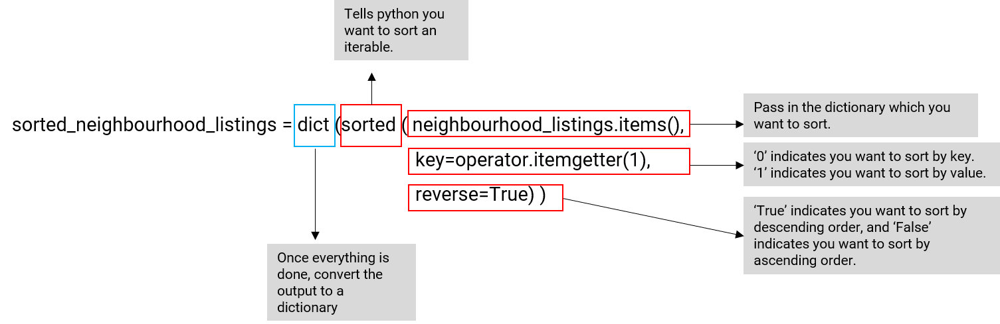
'/>

In [6]:
import operator
sorted_neighbourhood_listings = dict(sorted(neighbourhood_count.items(), key=operator.itemgetter(0),reverse=True))
print(sorted_neighbourhood_listings)

{'Yishun': 42, 'Woodlands': 70, 'Toa Payoh': 105, 'Tanglin': 230, 'Tampines': 85, 'Sungei Kadut': 4, 'Serangoon': 80, 'Sentosa': 18, 'Sengkang': 52, 'Sembawang': 47, 'Riverside': 84, 'Queenstown': 273, 'Punggol': 46, 'Pasir Ris': 71, 'Orchard': 33, 'Novena': 553, 'Mount Faber': 6, 'Marine Parade': 84, 'Marina Bay': 60, 'Mandai': 6, 'Little India': 58, 'Keppel Bay': 5, 'Katong': 256, 'Kallang': 1067, 'Jurong West': 162, 'Jurong East': 112, 'Hougang': 106, 'Holland Village': 2, 'Geylang': 1020, 'Clementi': 114, 'Choa Chu Kang': 71, 'Chinatown': 305, 'Central Area': 1546, 'Bukit Timah': 126, 'Bukit Panjang': 37, 'Bukit Merah': 514, 'Bukit Batok': 75, 'Bugis/Kampong Glam': 245, 'Boon Lay': 1, 'Bishan': 93, 'Bedok': 335, 'Arab Street': 29, 'Ang Mo Kio': 61, '': 4}


<b>2e.ii) Extract the keys & values, and slice the top 10 based on the sorting</b>

After you have derived at a list sorted in descending order, the next step is simple to slice the top 10 values from the dictionary. You can do it via this method:

<img src='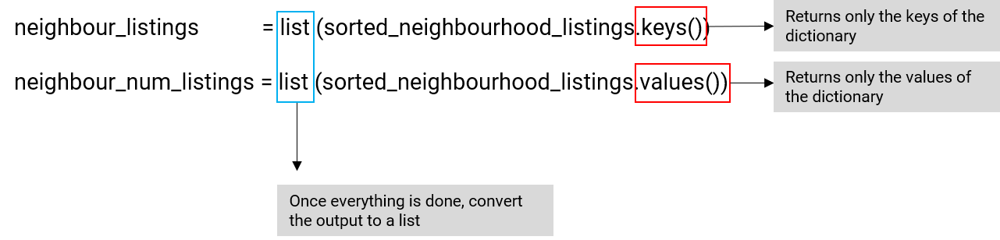
'/>

In [7]:
neighbour_listings = list(sorted_neighbourhood_listings.keys())
neighbour_num_listings = list(sorted_neighbourhood_listings.values())

print(neighbour_listings)
print('----')
print(neighbour_num_listings)

['Yishun', 'Woodlands', 'Toa Payoh', 'Tanglin', 'Tampines', 'Sungei Kadut', 'Serangoon', 'Sentosa', 'Sengkang', 'Sembawang', 'Riverside', 'Queenstown', 'Punggol', 'Pasir Ris', 'Orchard', 'Novena', 'Mount Faber', 'Marine Parade', 'Marina Bay', 'Mandai', 'Little India', 'Keppel Bay', 'Katong', 'Kallang', 'Jurong West', 'Jurong East', 'Hougang', 'Holland Village', 'Geylang', 'Clementi', 'Choa Chu Kang', 'Chinatown', 'Central Area', 'Bukit Timah', 'Bukit Panjang', 'Bukit Merah', 'Bukit Batok', 'Bugis/Kampong Glam', 'Boon Lay', 'Bishan', 'Bedok', 'Arab Street', 'Ang Mo Kio', '']
----
[42, 70, 105, 230, 85, 4, 80, 18, 52, 47, 84, 273, 46, 71, 33, 553, 6, 84, 60, 6, 58, 5, 256, 1067, 162, 112, 106, 2, 1020, 114, 71, 305, 1546, 126, 37, 514, 75, 245, 1, 93, 335, 29, 61, 4]


Here you can slice the above list to extract the top 10 values

In [8]:
neighbour_listings = neighbour_listings[:10]
neighbour_num_listings = neighbour_num_listings[:10]

print(neighbour_listings)
print('----')
print(neighbour_num_listings)

# We can conclude that most of the listings are concentrated in the central area of singapore

['Yishun', 'Woodlands', 'Toa Payoh', 'Tanglin', 'Tampines', 'Sungei Kadut', 'Serangoon', 'Sentosa', 'Sengkang', 'Sembawang']
----
[42, 70, 105, 230, 85, 4, 80, 18, 52, 47]


2f. Data Exploration: Top 10 Host with most Listings [Student Exercise]
---

<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- We would like to find out which are the top 10 Airbnb hosts with the most listings in Singapore.
    
    
<b>User story:</b>
- Write a <span class="badge badge-primary">for</span> loop to iterate through the database <b>singapore_airbnb_listings</b>, and use a dictionary to keep track of the number of listings by each host ID.
- After some data transformation, your output should print **2 lists of length 10**: (1) host IDs of top 10 hosts, (2) number of listings for each of the top 10 hosts.
- Expected output:<br><br>

<div style="margin-left:30px;background:white;">
['66406177', '8492007', '248361661', '209913841', '29420853', '31464513', '108773366', '2413412', '23722617', '154777656'] <br>
[277, 193, 172, 155, 132, 111, 107, 103, 85, 85]
</div>
    

</div>

In [9]:
## Write your code below

host_listings = {}

# Count number of listings for each host ID
for row in singapore_airbnb_listings:
    host_listing= (row[6])
    if host_listing not in host_listings:
        host_listings [host_listing]=1
    else:
        host_listings [host_listing]+=1
# Sort host_listings in descending order
import operator 
sorted_host_listings = dict(sorted(host_listings.items(), key=operator.itemgetter(1),reverse=True))
# Convert dictionary into 2 lists, and slice them to get top 10 host ID & listing count
host_ids = list(sorted_host_listings.keys())
counts = list(sorted_host_listings.values())

top10_host_ids= host_ids [:10]
top10_counts=counts[:10]
print (top10_host_ids, top10_counts)


['66406177', '8492007', '248361661', '209913841', '29420853', '31464513', '108773366', '2413412', '23722617', '154777656'] [277, 193, 172, 155, 132, 111, 107, 103, 85, 85]


In [10]:
sorted ([1,5,3], reverse=True)
#key operator allows you to choose wehether you want to sort by key or value

[5, 3, 1]

2g. Data Exploration: Visualise Top 10 Host Listings [Student Exercise]
---


<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- Now, let's try to make sense of the data summarised in 2f, with the help of a bar chart visualisation of the top 10 hosts & their number of listings.
    
    
<b>User story:</b>
- Create a bar chart with the host IDs in the x-axis, and the number of listings in the y-axis.
- Add a title, x-axis and y-axis label to the chart, and rotate the x-tick labels
- What insights can you draw from this bar chart?
- Expected output:<br><br>
    
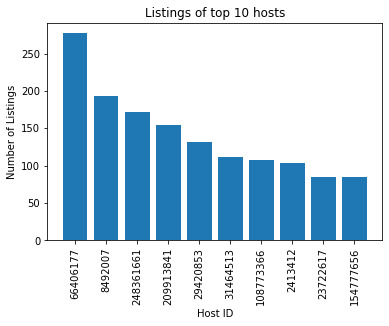
</div>

C:\Users\awsu-\AppData\Local\Temp/ipykernel_16736/4121925481.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(top10_host_ids, rotation=90)


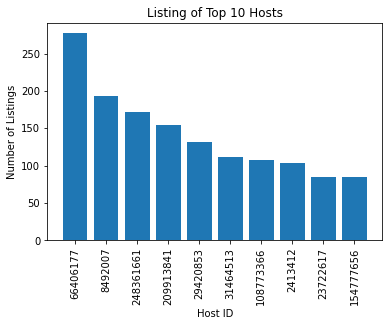

In [11]:
## Write your code below
import matplotlib.pyplot as plt 
fig,ax = plt.subplots()
ax.bar (top10_host_ids,top10_counts)
ax.set_xticklabels(top10_host_ids, rotation=90)
ax.set_xlabel ('Host ID')
ax.set_ylabel ('Number of Listings')
ax.set_title ('Listing of Top 10 Hosts')
plt.show()

2h. Data Exploration: Room Type Listings [Student Exercise]
---

<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- Your friend is curious to know the range of Airbnb listing types available on the platform (such as private room, shared room or entire home/apartment), as well as their proportion within the dataset.
- Could you write a python script to help your friend count the number of listings for each room type?
    
    
<b>User story:</b>
- Write a <span class="badge badge-primary">for</span> loop to iterate through the database <b>singapore_airbnb_listings</b>, and compile the number of listings of each unique <b>room_type</b> (index 13 of each row in dataset).
- Expected output:<br><br>

<div style="margin-left:30px;background:white;">    
{'Private room': 3582, 'Entire home/apt': 4264, 'Shared room': 447}
</div>   

</div>

In [12]:
## Write your code below
room_type_listings_dict={}
for row in singapore_airbnb_listings:
    room_type_listings=row[13]
    #print (room_type_listings)
    if room_type_listings not in room_type_listings_dict:
        room_type_listings_dict [room_type_listings]=1
    else:
        room_type_listings_dict [room_type_listings]+=1
print (room_type_listings_dict)


{'Private room': 3582, 'Entire home/apt': 4264, 'Shared room': 447}


2i. Data Exploration: Room Type Listings Visualise with Pie Chart
---

Pie charts are generally useful in allowing an appreciation of the proportion of one category relative to the others. Pie charts are <b>good for displaying data for around 6 categories or fewer.</b> Let's see how to implement a pie chart with Matplotlib. The way to create a pie chart is largely the same as how you would create a bar chart except that you use the <span class="badge badge-primary">pie()</span> function instead of the <span class="badge badge-primary">bar()</span> function. Let's review the few salient differences you need to take note of:

<img src='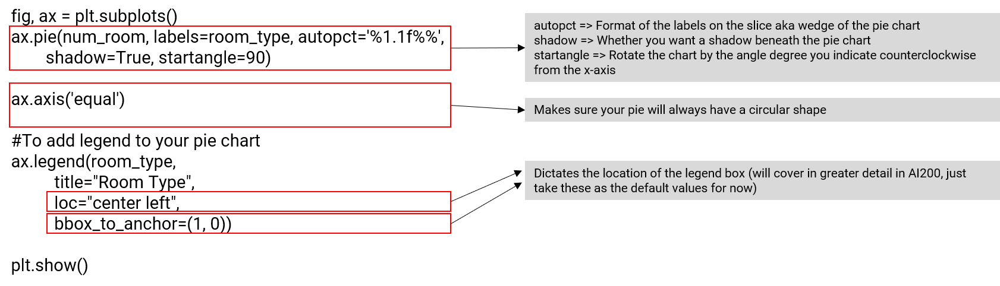
'/>


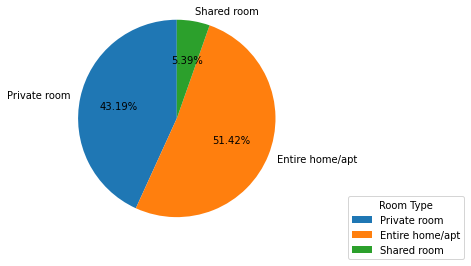

In [13]:
import matplotlib.pyplot as plt

room_type = list(room_type_listings_dict.keys())
num_room = list(room_type_listings_dict.values())

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
fig, ax = plt.subplots()
ax.pie(num_room, labels=room_type, autopct='%1.2f%%',
        shadow=False, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle (else it may end up as an oval shape).
ax.axis('equal')
# To add legend to your pie chart
ax.legend(room_type,
          title="Room Type",
          loc="center left",
          bbox_to_anchor=(1, 0))

plt.show()

2j. Data Exploration: Property Type Listings Visualise with Pie Chart [Student Exercise]
---

<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- Next, let's try a pie-chart visualisation of the property types available in Airbnb listings, and their respective propotions.
    
    
<b>User story:</b>
- The number of listings of each property type has been provided for you below, in the form of a python dictionary <b>property_type_listings</b>.
- Extract the top 6 property type and use the values extracted to plot a pie chart to show the proportion of each property type in this listing market
- What do you observe? What insights can you draw from this pie chart?
- Expected output:<br><br>

<img src='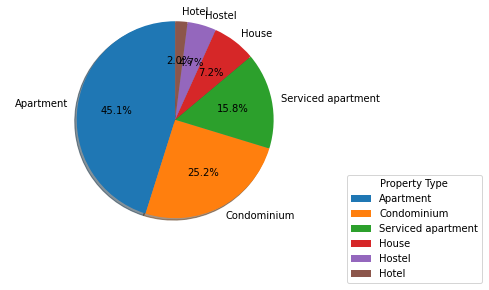
'/>
</div>

In [14]:
property_type_listings = {}

for row in singapore_airbnb_listings:
    
    propety_type = row[12]
    
    if propety_type in property_type_listings:
        
        property_type_listings[propety_type] += 1
        
    else:
        
        property_type_listings[propety_type] = 1
        

property_type_listings = dict(sorted(property_type_listings.items(), key=operator.itemgetter(1),reverse=True))
print(property_type_listings)

{'Apartment': 3431, 'Condominium': 1912, 'Serviced apartment': 1202, 'House': 544, 'Hostel': 360, 'Hotel': 153, 'Townhouse': 134, 'Loft': 122, 'Boutique hotel': 109, 'Bed and breakfast': 91, 'Bungalow': 59, 'Other': 58, 'Guesthouse': 32, 'Guest suite': 22, 'Tent': 18, 'Villa': 16, 'Aparthotel': 14, 'Boat': 6, 'Campsite': 4, 'Chalet': 3, 'Cabin': 1, 'Cottage': 1, 'Farm stay': 1}


In [15]:
## Write your code below
property_types=list(property_type_listings.keys())[:6]
counts_property_types=list(property_type_listings.values())[:6]
print (counts_property_types)
print (property_types)

[3431, 1912, 1202, 544, 360, 153]
['Apartment', 'Condominium', 'Serviced apartment', 'House', 'Hostel', 'Hotel']


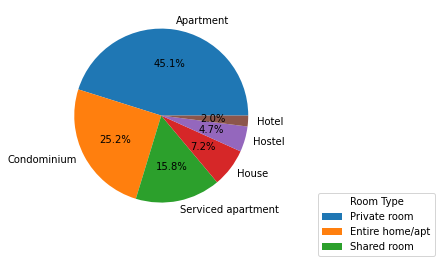

In [16]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.pie(counts_property_types, labels=property_types,autopct='%1.1f%%')
ax.legend(room_type,
          title="Room Type",
          loc="center left",
          bbox_to_anchor=(1.2, 0))

plt.show()


2k. Data Exploration: Understanding Listings Density with Folium Heatmap
---
<b>Folium is a powerful data visualization library in Python that was built primarily to help people visualize geospatial data</b>. With Folium, one can create a map of any location in the world if its latitude and longitude values are known.

To understand the density of the listings spatially, we can use the <b>folium heat map</b> to plot the listings. There are 2 broad steps to creating a heatmap:

i) Creating a folium base map of the location <br>
ii) Adding the heatmap layer

In [17]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


<b>2k.i) Creating a folium base map of the location </b>

Given that this is a custom library that is not part of python's usual package, we will have to install folium. Uncomment the code below and execute the cell!

In [18]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


To create a base map of the location you want to focus on, you just have to call on the <span class="badge badge-primary">Map()</span> function of the <b>folium library</b>. There are 2 parameters you need to pass the <span class="badge badge-primary">Map()</span> function:

- List containing the latitude and longitude (this will serve as the center point of the base map. The latitude and longitude we pass in below happens to be the centre point of singapore)
- Zoom_start indicates how zoomed in you want your map to be (you can try changing the value below)

In [19]:
import folium

map_folium = folium.Map([40.6892534,-74.0466891], zoom_start=11.4) # Create base map object

display(map_folium) # Display basemap

<b>2k.ii) Adding the heatmap layer </b>

Next we add a heatmap layer on top of the base map. Let's try it out with a small sample of 20 latitude & longitudes, and break down the code:

<img src='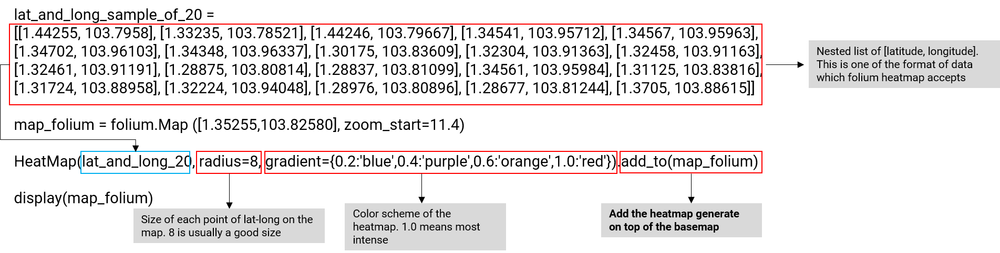
'/>

In [20]:
import folium
from folium.plugins import HeatMap                            # We need to first import the HeatMap folium plugin

lat_and_long_20 = [[1.44255, 103.7958], [1.33235, 103.78521], [1.44246, 103.79667], [1.34541, 103.95712], [1.34567, 103.95963], [1.34702, 103.96103], [1.34348, 103.96337], [1.30175, 103.83609], [1.32304, 103.91363], [1.32458, 103.91163], [1.32461, 103.91191], [1.28875, 103.80814], [1.28837, 103.81099], [1.34561, 103.95984], [1.31125, 103.83816], [1.31724, 103.88958], [1.32224, 103.94048], [1.28976, 103.80896], [1.28677, 103.81244], [1.3705, 103.88615]]

# Create a folium map object
map_folium = folium.Map([1.35255,103.82580], zoom_start=11.4)

# Pass in latitude and longitude data and HeatMap configurations. Add the generated HeatMap to the base map
HeatMap(lat_and_long_20, radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map_folium) 

display(map_folium)

2l. Data Exploration: Understanding Listings Density with Folium Heatmap [Student Exercise]
---

<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- You would like to understand the geospatial distribution and density of Airbnb listings throughout Singapore with the help of a heatmap.
    
    
<b>User story:</b>
- Write a <span class="badge badge-primary">for</span> loop to extract nested list of lat-long of all the airbnb listings in Singapore, and store it in a variable <b>lat_long</b>
- Use <b>lat_long</b> to generate a Folium heatmap of all Airbnb listings in Singapore
    - Base map configuration: coordinates of `[1.35255,103.82580]`, `zoom_start=11.4`
    - Heatmap configuration: `radius=8` and `gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}`
- What can you observe from this heatmap?
</div>

In [23]:
def extract_lat_long_price (database):
    lat_long =[]
    listing_price= []
    for row in singapore_airbnb_listings:
        lat_long.append([row[10]], row[11])
        listing_price.append (row[15])
    return lat_long, listing_price

In [24]:
lat_long_prices= extract_lat_long_price (singapore_airbnb_listings)

TypeError: list.append() takes exactly one argument (2 given)

In [25]:
list_of_coords=[]
for row in singapore_airbnb_listings:
    lat=row[10]
    long=row[11]
    list_of_coords.append ([lat,long])
print (list_of_coords)

[[1.44255, 103.7958], [1.33235, 103.78521], [1.44246, 103.79667], [1.34541, 103.95712], [1.34567, 103.95963], [1.34702, 103.96103], [1.34348, 103.96337], [1.30175, 103.83609], [1.32304, 103.91363], [1.32458, 103.91163], [1.32461, 103.91191], [1.28875, 103.80814], [1.28837, 103.81099], [1.34561, 103.95984], [1.31125, 103.83816], [1.31724, 103.88958], [1.32224, 103.94048], [1.28976, 103.80896], [1.28677, 103.81244], [1.3705, 103.88615], [1.28537, 103.81087], [1.34943, 103.95951], [1.3142, 103.90232], [1.3115, 103.83759], [1.31159, 103.83805], [1.29345, 103.83562], [1.34838, 103.9592], [1.34816, 103.93238], [1.34135, 103.71139], [1.33171, 103.79383], [1.34153, 103.95775], [1.30109, 103.85234], [1.28358, 103.83361], [1.31016, 103.79853], [1.30901, 103.79639], [1.36743, 103.87288], [1.30792, 103.92287], [1.27663, 103.84521], [1.27689, 103.84636], [1.30377, 103.89956], [1.35001, 103.87161], [1.37527, 103.94562], [1.34143, 103.84945], [1.28315, 103.84213], [1.39963, 103.9064], [1.28342, 103.7

In [26]:
## Write your code below
import folium
from folium.plugins import HeatMap
base_map=folium.Map ([1.35255, 103.82590], zoom_start=11.4) # call out singapore map
HeatMap(list_of_coords, radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(base_map) 
display (base_map)


2m. Data Exploration: Showing Exact Position of Listing with Folium Marker
---
While a heatmap is good for showing the concentration of listings, the data it provides is not very precise. For instance, you can't tell the exact location of the listing, nor its price.

To address this, we can use the <span class="badge badge-primary">Marker()</span> function of folium

First we need to prepare the data in the format which the marker cluster requires

In [27]:
# In this case we are also gather the list of prices of the listing
lat_long = []
listing_price = []

for row in singapore_airbnb_listings:
    
    lat_long.append([row[10],row[11]])
    listing_price.append(row[15])
    
    
# Let's slice out the first 10 lat_long and price
lat_long_10 = lat_long[:10]
price_10 = listing_price[:10]

print(lat_long_10)
print(price_10)

[[1.44255, 103.7958], [1.33235, 103.78521], [1.44246, 103.79667], [1.34541, 103.95712], [1.34567, 103.95963], [1.34702, 103.96103], [1.34348, 103.96337], [1.30175, 103.83609], [1.32304, 103.91363], [1.32458, 103.91163]]
[81.0, 80.0, 68.0, 200.0, 92.0, 102.0, 203.0, 120.0, 51.0, 58.0]


Next we are going to iterate through this list of 10 lat_long and price to illustrate the marker. For the marker, you need to pass it 3 parameters, before you add it to the base map:

- nested list of lat and long listing (in the same format as the heatmap)
- display message for the popup
- the message for the tooltip (for on hover)

In [28]:
# Create a folium map object
map_folium = folium.Map([1.35255,103.82580], zoom_start=11.4)

# Iterate through list of 10 lat_long
for i in range(0,len(lat_long_10)):
    
    lat_long_of_one_listing = lat_long_10[i]    # Get a pair of lat and long
    pop_display_price = '$' + str(price_10[i])  # Get the price of listing and format the string
    tooltip_msg = 'Click me!'
    # these two codes above is to prepare the arguments
    # Generate marker and add to base map
    folium.Marker(lat_long_of_one_listing, popup=pop_display_price, tooltip=tooltip_msg).add_to(map_folium)
    
display(map_folium)

2n. Data Exploration: Showing Density Exact Position of Listing with Folium Marker Cluster
---

There are however two limitations to the above method:
- Imagine if we were to list everything, all 8000 plus listings, the map would be too cluttered, and we would not be able to see anything.
- The above method does not really allow us to see the density of listings like the heatmap does

To address this problem, we can make use of Folium's <span class="badge badge-primary">MarkerCluster()</span>. Let's break down the more difficult parts of the code:

***

<img src='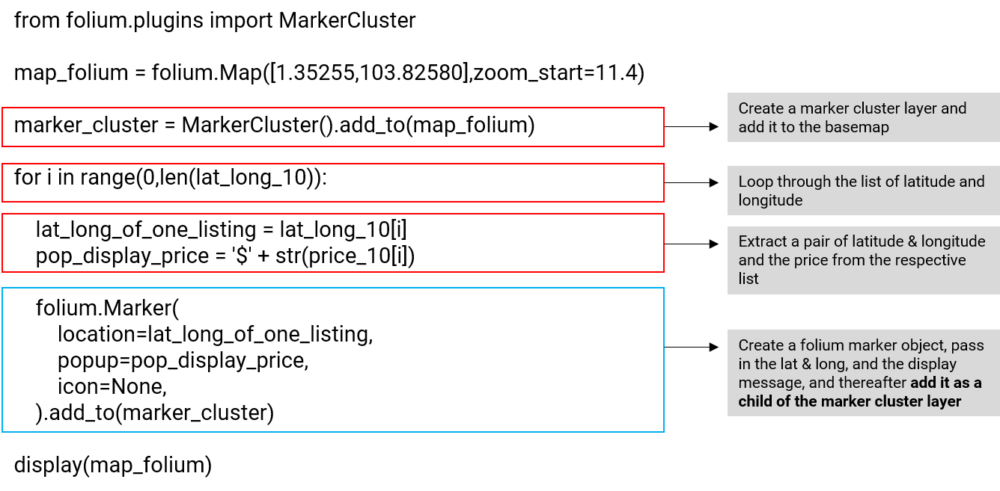
'/>

In [29]:
from folium.plugins import MarkerCluster       # Import the MarkerCluster folium plugin

map_folium = folium.Map([1.35255,103.82580], zoom_start=11.4)

# Create a MarkerCluster layer and add it to the base map
marker_cluster = MarkerCluster().add_to(map_folium)

for i in range(0,len(lat_long_10)):
    
    lat_long_of_one_listing = lat_long_10[i]    # Get a pair of lat and long
    pop_display_price = '$' + str(price_10[i])  # Get the price of listing and format the string
    
    # Create a marker object, and thereafter add it to the marker cluster layer we created earlier
    folium.Marker(
        location=lat_long_of_one_listing,
        popup=pop_display_price,
        icon=None,
    ).add_to(marker_cluster)

display(map_folium)

2o. Data Exploration: Showing Density Exact Position of Listing with Folium Marker Cluster [Student Exercise]
---
<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- You would like to understand the geospatial distribution and density of Airbnb listings throughout Singapore with the help of a heatmap.
- This time, you are curious as to the exact location of individual Airbnb listings, and seek to use an interactive Marker Cluster map to avoid overcrowding the visualisation.    
    
<b>User story:</b>
- You have been provided a function that extracts the latitude and longitude data, as well as the price.
- Use the function provided to generate a Marker Cluster map showing all the listings in Singapore.
    - Base map configuration: coordinates of `[1.35255,103.82580]`, `zoom_start=11.4`
</div>

In [30]:
# Function to extract lat_long_price
def extract_lat_long_price(database):
    
    lat_long = []
    listing_price = []

    for row in singapore_airbnb_listings:

        lat_long.append([row[10],row[11]])
        listing_price.append(row[15])
        
    # Yes you can return multiple outputs like this in python
    return lat_long, listing_price

In [31]:
lat_long, prices= extract_lat_long_price (singapore_airbnb_listings)
print (lat_long, prices)

[[1.44255, 103.7958], [1.33235, 103.78521], [1.44246, 103.79667], [1.34541, 103.95712], [1.34567, 103.95963], [1.34702, 103.96103], [1.34348, 103.96337], [1.30175, 103.83609], [1.32304, 103.91363], [1.32458, 103.91163], [1.32461, 103.91191], [1.28875, 103.80814], [1.28837, 103.81099], [1.34561, 103.95984], [1.31125, 103.83816], [1.31724, 103.88958], [1.32224, 103.94048], [1.28976, 103.80896], [1.28677, 103.81244], [1.3705, 103.88615], [1.28537, 103.81087], [1.34943, 103.95951], [1.3142, 103.90232], [1.3115, 103.83759], [1.31159, 103.83805], [1.29345, 103.83562], [1.34838, 103.9592], [1.34816, 103.93238], [1.34135, 103.71139], [1.33171, 103.79383], [1.34153, 103.95775], [1.30109, 103.85234], [1.28358, 103.83361], [1.31016, 103.79853], [1.30901, 103.79639], [1.36743, 103.87288], [1.30792, 103.92287], [1.27663, 103.84521], [1.27689, 103.84636], [1.30377, 103.89956], [1.35001, 103.87161], [1.37527, 103.94562], [1.34143, 103.84945], [1.28315, 103.84213], [1.39963, 103.9064], [1.28342, 103.7

In [32]:
## Write your code below
import folium
from folium.plugins import MarkerCluster
map_folium = folium.Map([1.35255,103.82580], zoom_start=11.4)
marker_cluster = MarkerCluster().add_to(map_folium)

for i in range(len(prices)):
    
    lat_long_of_one_listing = lat_long [i]   # Get a pair of lat and long
    pop_display_price = '$' + str(prices[i])  # Get the price of listing and format the string
    
    # Create a marker object, and thereafter add it to the marker cluster layer we created earlier
    folium.Marker(
        location=lat_long_of_one_listing,
        popup=pop_display_price,
        icon=None,
    ).add_to(marker_cluster)

display(map_folium)

2p. Data Exploration: Plotting Satisfaction on Map via Matplotlib (Optional)
---

In the event where you wish to plot all listings on the map of the Singapore, whilst also showing the reviews scores, you can consider plotting a scatterplot on a map of singapore. Firstly, we need to write a for loop to extract the latitudes, longitudes and review scores into separate lists.

In [33]:
# Extract the longitudes, latitudes and review scores into separate lists
long = []
lat = []
reviews_score = []

for row in singapore_airbnb_listings:
    long.append(row[11])
    lat.append(row[10])
    reviews_score.append(row[17])

Next, we load a png image of Singapore, and then plot a scatter chart on top of the Singapore image.

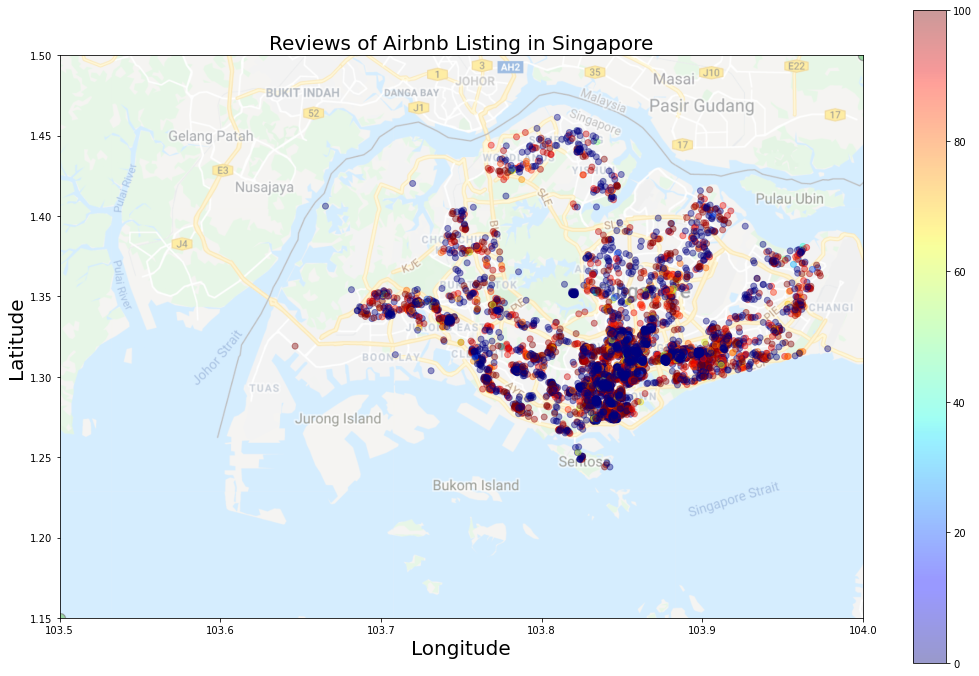

In [34]:
# Import image of Singapore
singapore_img = plt.imread('image/singapore_image.png')

# Create fig and ax
fig, ax = plt.subplots(figsize=(18,12)) # Configure the combined figure size of all subplots

# Generate scatter plot
scatter_plot_obj = ax.scatter(long, lat,
                              c=reviews_score,
                              cmap=plt.get_cmap("jet"),
                              vmin=min(reviews_score), 
                              vmax=max(reviews_score),
                              alpha=0.4)

# Set the title of the plot
plt.title('Reviews of Airbnb Listing in Singapore', fontsize=20)

# Set the ylabel and xlabel of plot
plt.ylabel('Latitude', fontsize=20)
plt.xlabel('Longitude', fontsize=20)

# Create the legend
cbar = plt.colorbar(mappable=scatter_plot_obj, ax=ax)

# Show the Singapore map
plt.imshow(singapore_img, extent=[103.5, 104, 1.15, 1.50], alpha=0.5)

# Display scatterplot
plt.show()

2q. Data Exploration: Word Cloud of Description
---

<b>Word cloud is an image composed of words used in a particular text corpus</b>, in which the size of each word indicates its frequency or importance. So, the more often a specific word appears in your text, the bigger and bolder it appears in your word cloud.


Given that this is a custom library not part of python's standard packages, we will have to install wordcloud. Uncomment the code below and execute the cell!

In [ ]:
pip install wordcloud

The `WordCloud` library is designed to take in a string, and generate a word cloud from the string input. As such, below we iterate through the entire listing to combine all the description of the listings into one super long string variable called <b>collection_of_description</b>.

In [ ]:
collection_of_description = ''

for row in singapore_airbnb_listings:
    
    collection_of_description += row[3] + ' '

    
# Print the first 200 characters of the string
print(collection_of_description[:200])

In [ ]:
collection_of_description[:10000]

Below, you just need to pass in the string which we prepared for the word cloud into the <span class="badge badge-primary">generate()</span> function , and also state the max number of words to show, and viola!

In [ ]:
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt

# Generate word cloud image
wordcloud = WordCloud(max_words=200, background_color='white').generate(collection_of_description)
plt.figure(figsize=(25,20))

# Display the image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

2r. Data Exploration: Word Cloud of Description [Student Exercise]
---
<br>

<div class="alert alert-block alert-info">
    
<b>Background:</b>
    
- Your friend is interested to list his Airbnb apartment! Help him investigate the most commonly used words in Airbnb listing titles, so that he can strategise on how he should craft his listing.
    
    
<b>User story:</b>
- Generate a word cloud using the "name" of all the airbnb listings in Singapore
- Expected output (Your output layout may differ slightly, but the words should not vary much) :
    
    <img src='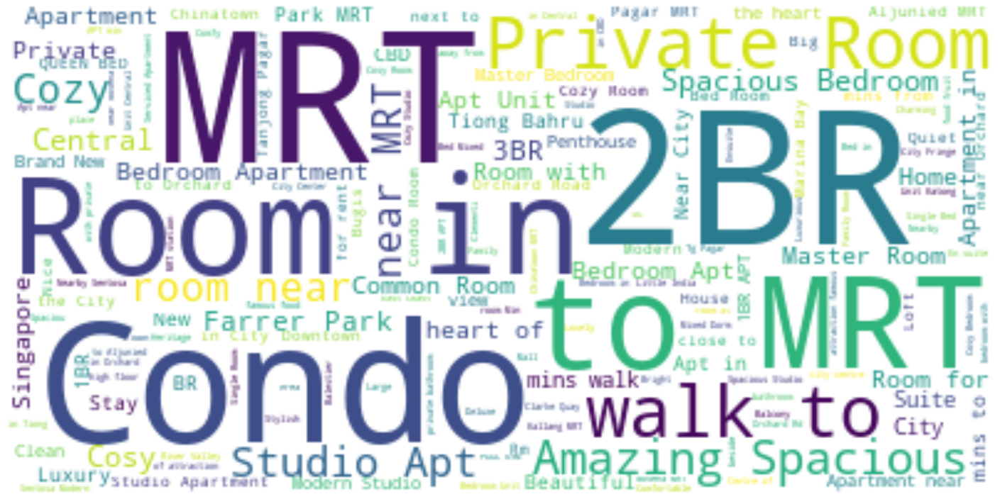
' width='600' height='400'/>
</div>

In [ ]:
## Write your code below














